## Cumputer Vision
### Module 2. Image segmentation and correspondence problems
    
Anastasiia Kasprova

Link to Google Colab: 

### Task 2.1: Separate text from background
*correct solution should set text to black and background to white in the following areas

In [1]:
import scipy as sc
import cv2
import numpy as np
import imutils
from skimage import io, feature, morphology 
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage
from matplotlib import pyplot as plt
#from google.colab.patches import cv2_imshow

def url_to_image(url):
  print("downloading %s" % (url))
  return cv2.cvtColor(io.imread(url), cv2.COLOR_BGR2RGB)

In [6]:
!ls ../../images/segmentaion/text

text1.jpg
text2.jpg
text3.jpg
text4.jpg
text5.jpg
text6.jpg


#### Approach to find out the regions where text is:
    1. Convert an image to grayscale
    2. Apply a binary threshold
    3. Apply dilation to thicken lines
    4. Identify contours of objects
    5. Draw a bounding box (rectangle) around a block of text.

### text1.jpg

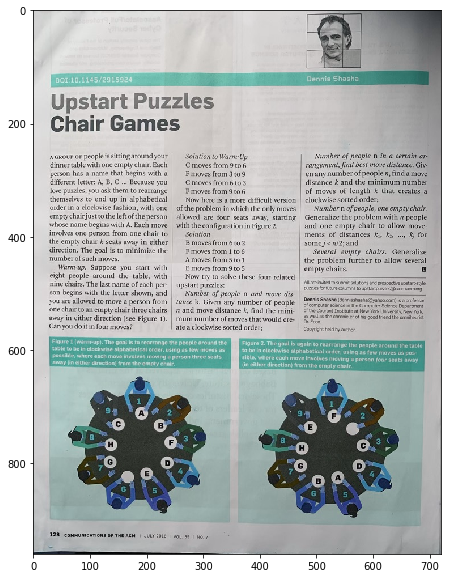

In [264]:
img = cv2.imread('../../images/segmentaion/text/text1.jpg')
plt.figure(figsize=(20, 10))
plt.imshow(img)

In [271]:
#read image
img = cv2.imread('../../images/segmentaion/text/text1.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#FIND THE REGION WITH TEXT
#apply threshold
thresh = cv2.threshold(gray,150,255,cv2.THRESH_BINARY_INV)[1]
#generate kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
#dilate
dilated = cv2.dilate(thresh,kernel,iterations = 5)
#find countours
contours, hierarchy= cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

# for each contour found, draw a rectangle around it on original image
dict_text = {} # to store areas of interest
for index,contour in enumerate(contours):
    # get rectangle bounding contour
    [x,y,w,h] = cv2.boundingRect(contour)
    
    if h>40 and w>300: #from human observation:)

        # draw rectangle around contour on original image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,255),2)
        dict_text[index] = [x,y,w+x,h+y]
        

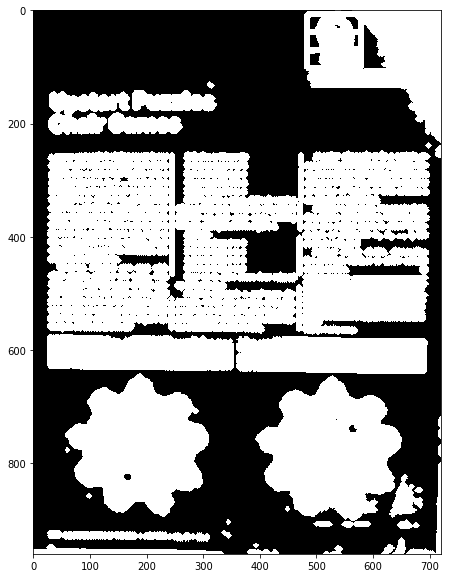

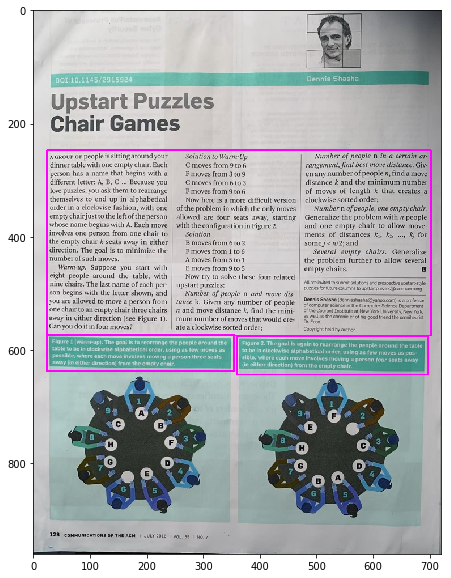

In [158]:

plt.figure(figsize=(20, 10))
plt.imshow(dilated, cmap = "gray")

plt.figure(figsize=(20, 10))
plt.imshow(img, cmap = "gray")

In [159]:
#detected regions of the text
dict_text

{21: [359, 575, 697, 643], 22: [24, 572, 354, 637], 23: [24, 247, 702, 574]}

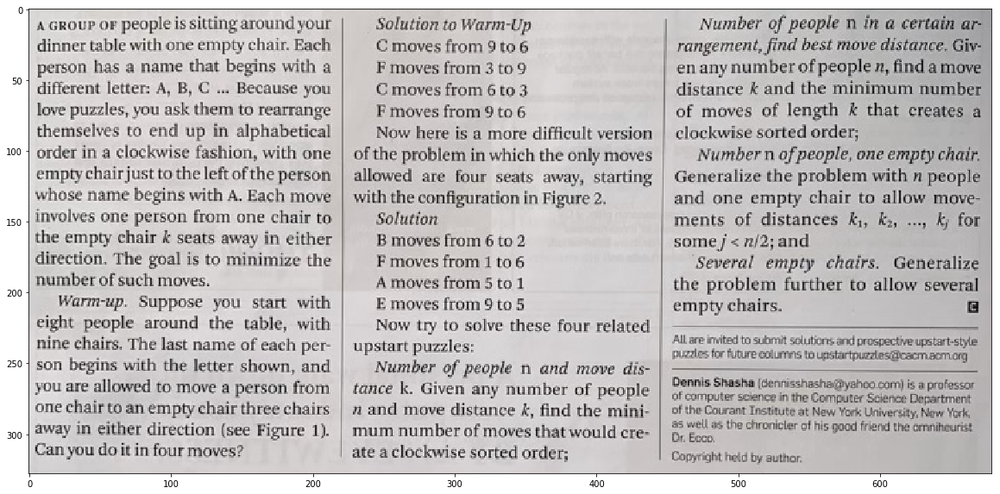

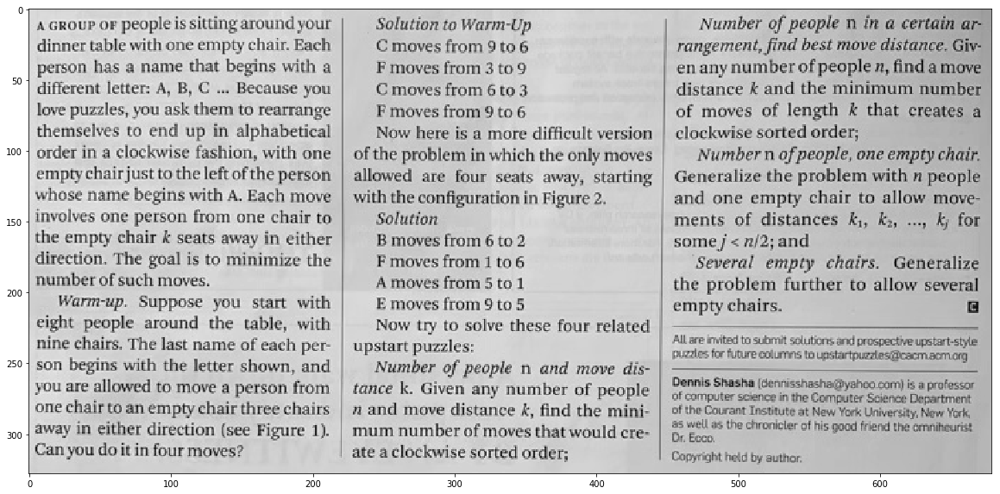

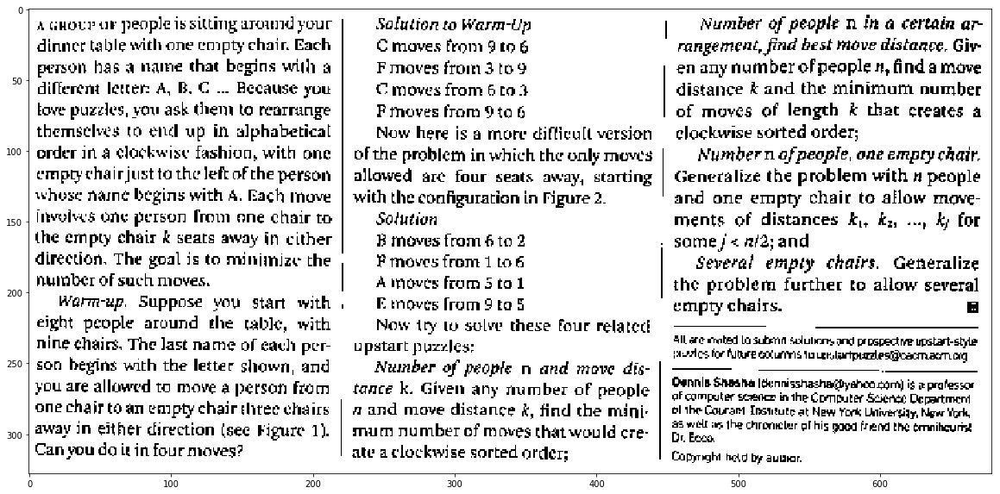

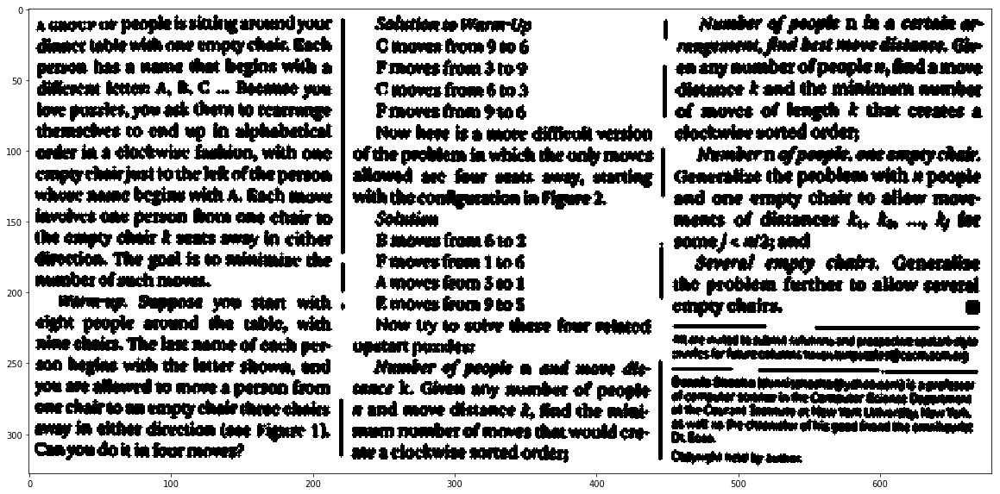

In [267]:
#initialize tensor which corresponds to the light area of the text
C = img[247:574+1,24:702+1]
plt.figure(1,figsize=(20, 10)); plt.imshow(C, cmap = "gray")

gray = cv2.cvtColor(C,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(20, 10));plt.imshow(gray, cmap = "gray")

thresh_C = cv2.threshold(gray,140,255,cv2.THRESH_BINARY)[1]
plt.figure(3,figsize=(20, 10));plt.imshow(thresh_C, cmap = "gray")

test = cv2.erode(thresh_C, kernel, iterations=1)
plt.figure(4,figsize=(20, 10));plt.imshow(test, cmap = "gray")

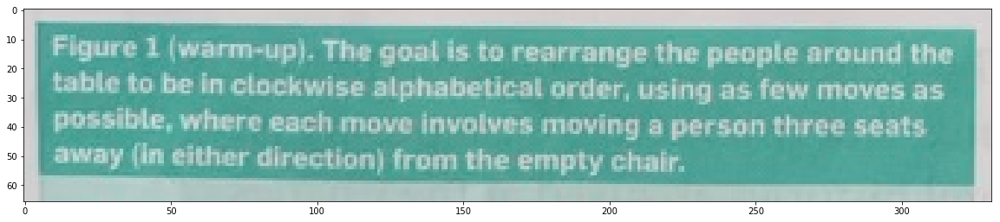

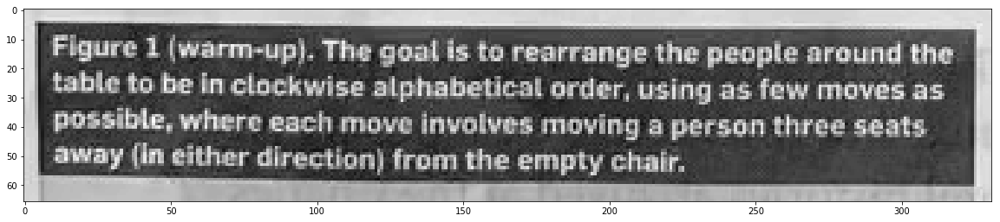

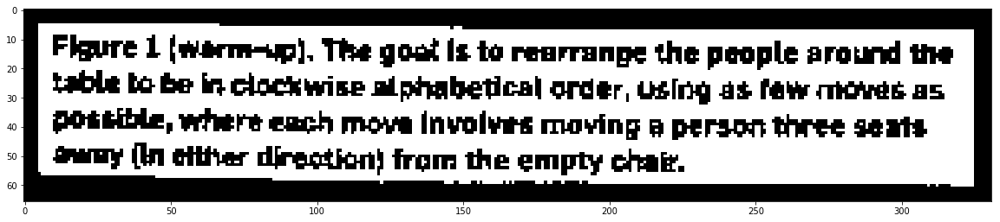

In [268]:
#initialize tensor which corresponds to the dark area of the text
B = img[572:637+1,24:354+1]
plt.figure(1,figsize=(20, 10)); plt.imshow(B, cmap = "gray")

gray = cv2.cvtColor(B,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(20, 10));plt.imshow(gray, cmap = "gray")

thresh_B = cv2.threshold(gray,165,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(20, 10));plt.imshow(thresh_B, cmap = "gray")

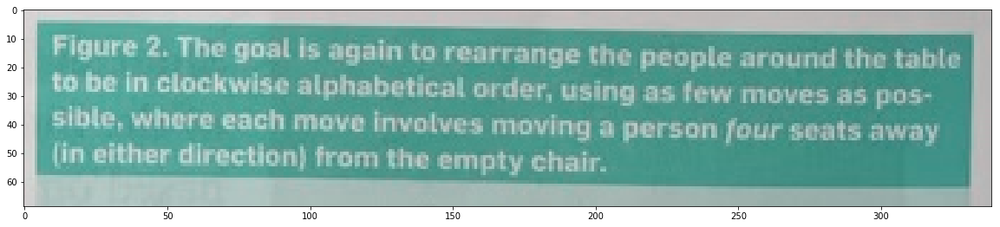

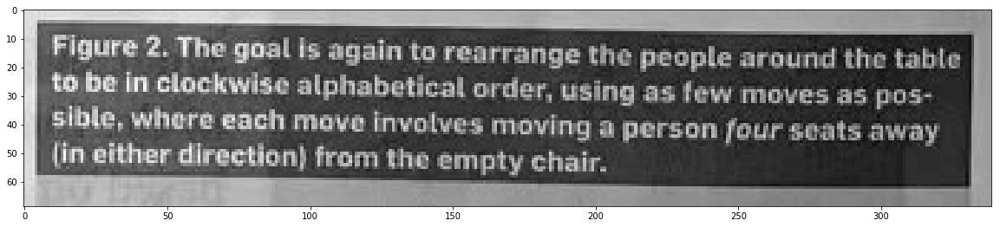

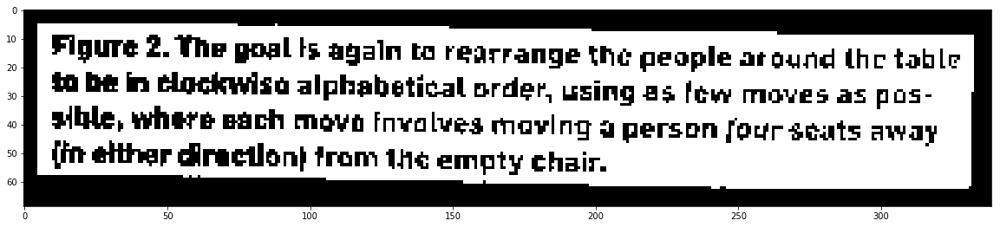

In [269]:
img = cv2.imread('../../images/segmentaion/text/text1.jpg')

#initialize tensor which corresponds to the dark area of the text
A = img[575:643+1,359:697+1]
plt.figure(1,figsize=(20, 10)); plt.imshow(A, cmap = "gray")

gray = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(20, 10));plt.imshow(gray, cmap = "gray")

thresh_A = cv2.threshold(gray,165,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(20, 10));plt.imshow(thresh_A, cmap = "gray")

In [281]:
#read image
img = cv2.imread('../../images/segmentaion/text/text1.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [282]:
#build a required representation of the text
R = np.ones_like(gray)*255
R[575:643+1,359:697+1] = thresh_A
R[572:637+1,24:354+1] = thresh_B
R[247:574+1,24:702+1] = thresh_C

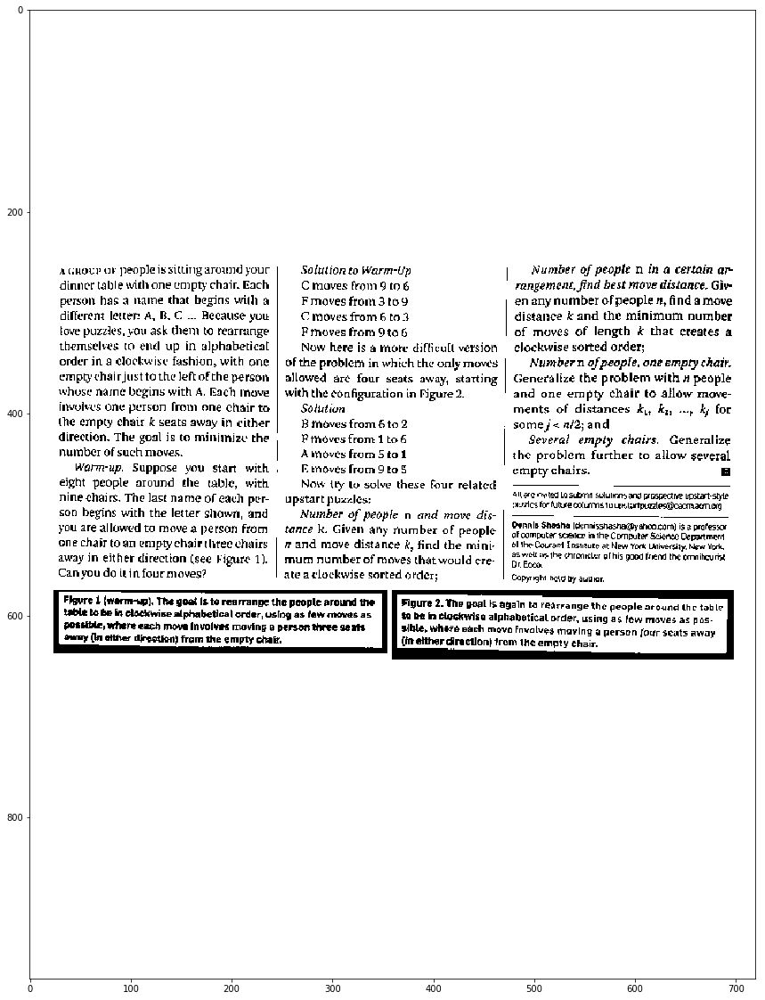

In [283]:
plt.figure(figsize=(30, 20));plt.imshow(R, cmap = "gray")

### text3.jpg

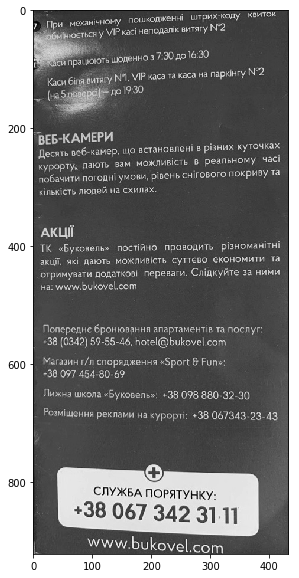

In [474]:
#read image
img = cv2.imread('../../images/segmentaion/text/text3.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 10))
plt.imshow(gray, cmap = "gray")

{7: [35, 765, 418, 922],
 14: [14, 669, 419, 702],
 15: [13, 637, 372, 667],
 16: [12, 582, 330, 630],
 20: [12, 528, 393, 580],
 25: [7, 359, 422, 480],
 27: [0, 201, 423, 319],
 32: [0, 0, 396, 189]}

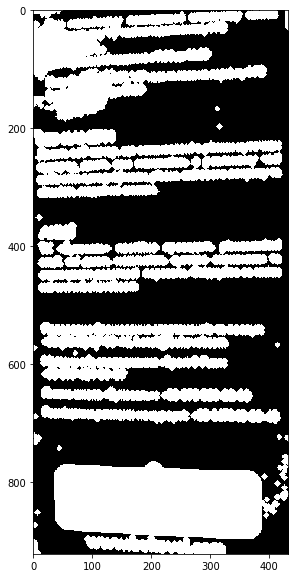

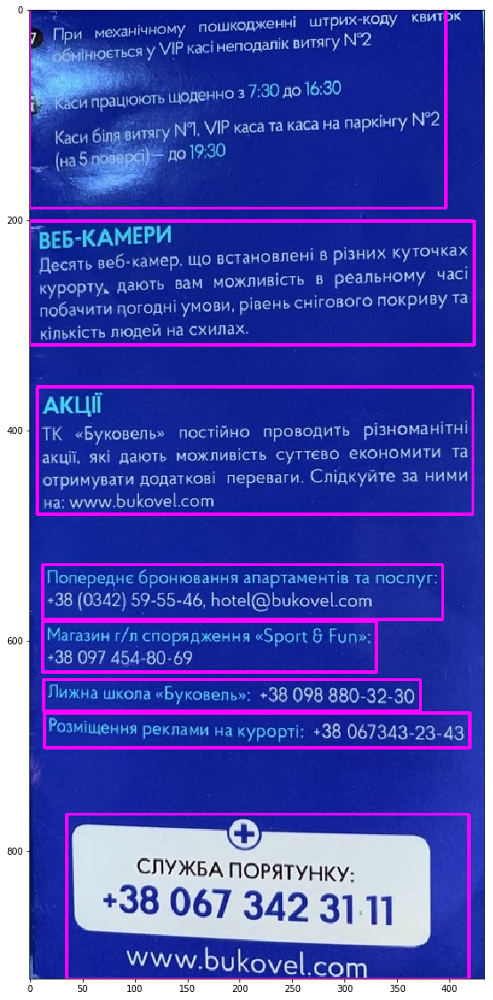

In [479]:
#read image
img = cv2.imread('../../images/segmentaion/text/text3.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#FIND THE REGION WITH TEXT
#apply threshold
thresh = cv2.threshold(gray,100,255,cv2.THRESH_BINARY)[1]
#generate kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
#dilate
dilated = cv2.dilate(thresh,kernel,iterations = 5)
#find countours
contours, hierarchy= cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

# for each contour found, draw a rectangle around it on original image

dict_text = {} # to store areas of interest
for index,contour in enumerate(contours):
    # get rectangle bounding contour
    [x,y,w,h] = cv2.boundingRect(contour)
    
    if w>300 and h>20: #from human observation:)

        # draw rectangle around contour on original image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,255),2)
        dict_text[index] = [x,y,w+x,h+y]

plt.figure(figsize=(20, 10))
plt.imshow(dilated, cmap = "gray")

plt.figure(figsize=(30, 20))
plt.imshow(img, cmap = "gray")

dict_text

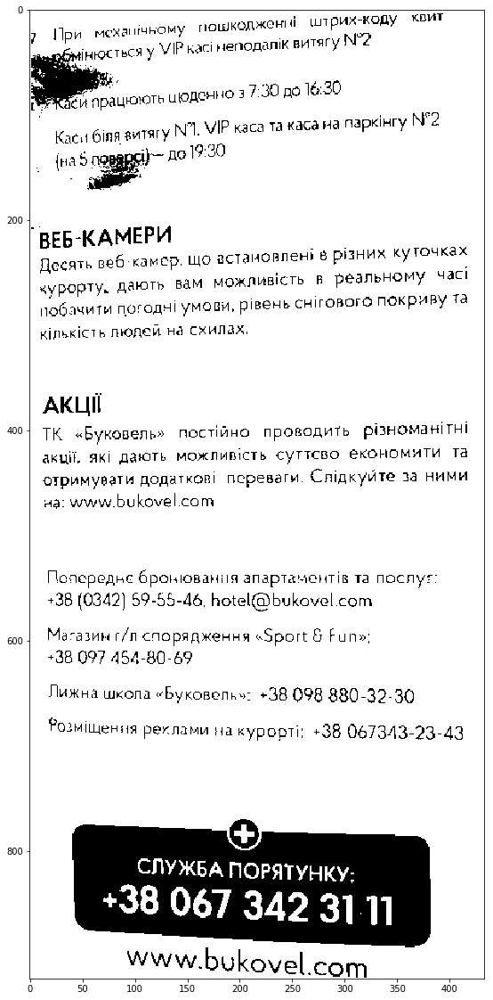

In [499]:
#initialized metrix with the size of initial image of gray scale fulfilled with white color
R_3 = np.ones_like(gray)*255

#loop over found regions
for index, key in enumerate(dict_text):
    
    #initialize tensor which corresponds to the dark area of the text
    A = img[dict_text[key][1]:dict_text[key][3]+1,dict_text[key][0]:dict_text[key][2]+1]
    gray_A = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
    thresh_A = cv2.threshold(gray_A,160,255,cv2.THRESH_BINARY_INV)[1]
    
    #add text region to the new image
    R_3[dict_text[key][1]:dict_text[key][3]+1,dict_text[key][0]:dict_text[key][2]+1] = thresh_A

plt.figure(figsize=(30, 20));plt.imshow(R_3, cmap = "gray")

In [ ]:
plt.figure(figsize=(30, 20));plt.imshow(R, cmap = "gray")

In [ ]:
extract_text_from_selected_area(src, ratio,)
#initialize tensor which corresponds to the dark area of the text
A = img[dict_text[i][1]:dict_text[i][3]+1,dict_text[i][0]:dict_text[i][2]+1]
plt.figure(1,figsize=(30, 20)); plt.imshow(A, cmap = "gray")

gray_A = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(30, 20));plt.imshow(gray_A, cmap = "gray")

thresh_A = cv2.threshold(gray_A,150,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(30, 20));plt.imshow(thresh_A, cmap = "gray")

### text4.jpg

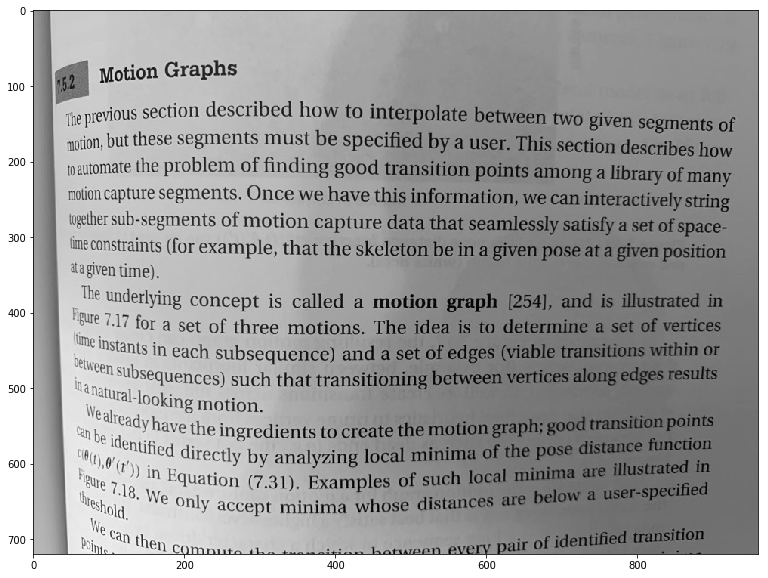

In [324]:
#read image
img = cv2.imread('../../images/segmentaion/text/text4.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 10))
plt.imshow(gray, cmap = "gray")

In [309]:
#FIND THE REGION WITH TEXT
#apply threshold
thresh = cv2.threshold(gray,150,255,cv2.THRESH_BINARY_INV)[1]
#generate kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
#dilate
dilated = cv2.dilate(thresh,kernel,iterations = 8)
#find countours
contours, hierarchy= cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

# for each contour found, draw a rectangle around it on original image
dict_text = {} # to store areas of interest
for index,contour in enumerate(contours):
    # get rectangle bounding contour
    [x,y,w,h] = cv2.boundingRect(contour)
    
    if w>600: #from human observation:)

        # draw rectangle around contour on original image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,255),2)
        dict_text[index] = [x,y,w+x,h+y]

plt.figure(figsize=(20, 10))
plt.imshow(dilated, cmap = "gray")

plt.figure(figsize=(20, 10))
plt.imshow(img, cmap = "gray")

In [311]:
#detected regions of the text
dict_text

{0: [36, 0, 960, 720]}

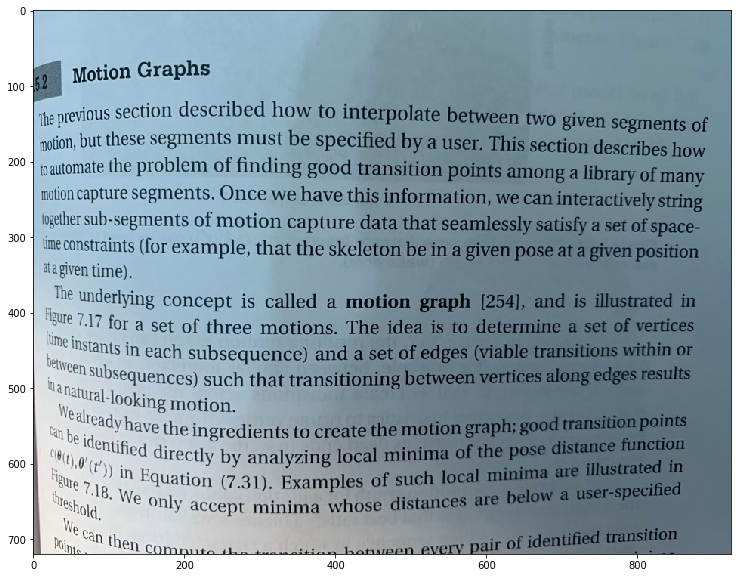

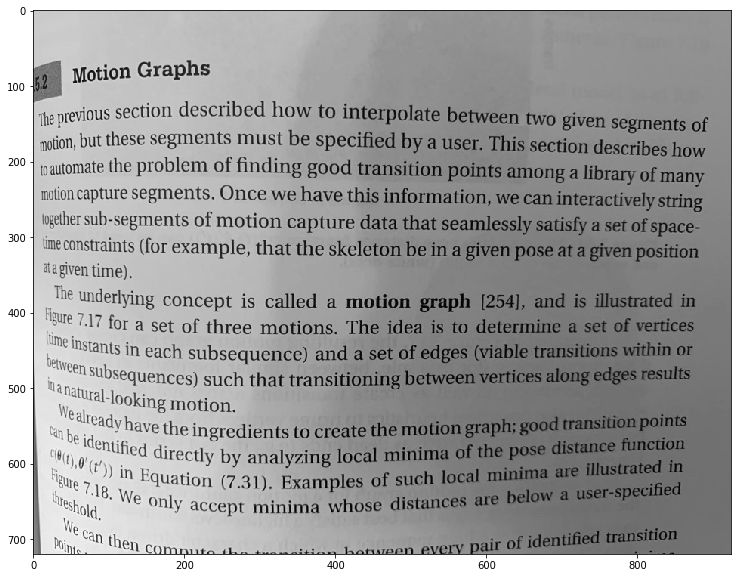

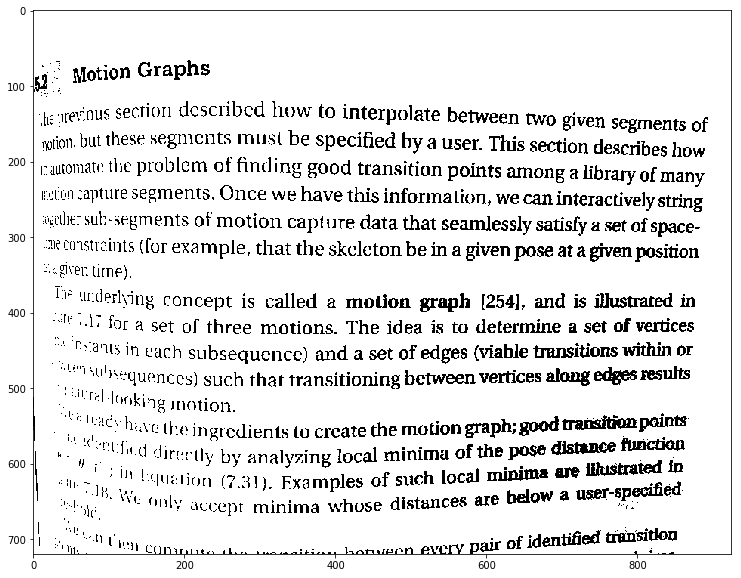

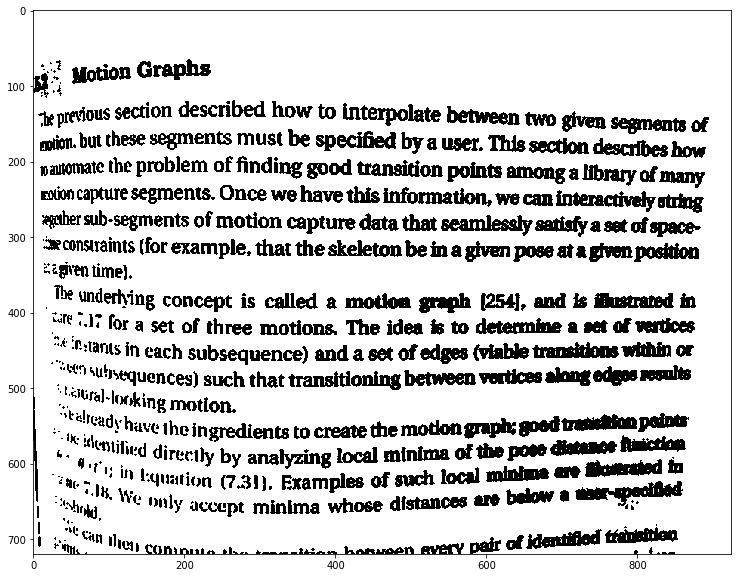

In [325]:
#initialize tensor which corresponds to the light area of the text
C = img[0:720+1,36:709602+1]
plt.figure(1,figsize=(20, 10)); plt.imshow(C, cmap = "gray")

gray_C = cv2.cvtColor(C,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(20, 10));plt.imshow(gray_C, cmap = "gray")

thresh_C = cv2.threshold(gray_C,105,255,cv2.THRESH_BINARY)[1]
plt.figure(3,figsize=(20, 10));plt.imshow(thresh_C, cmap = "gray")

test_C = cv2.erode(thresh_C, kernel, iterations=1)
plt.figure(4,figsize=(20, 10));plt.imshow(test_C, cmap = "gray")

In [326]:
#build a required representation of the text
R_4 = np.ones_like(gray)*255
R_4[0:720+1,36:709602+1] = test_C

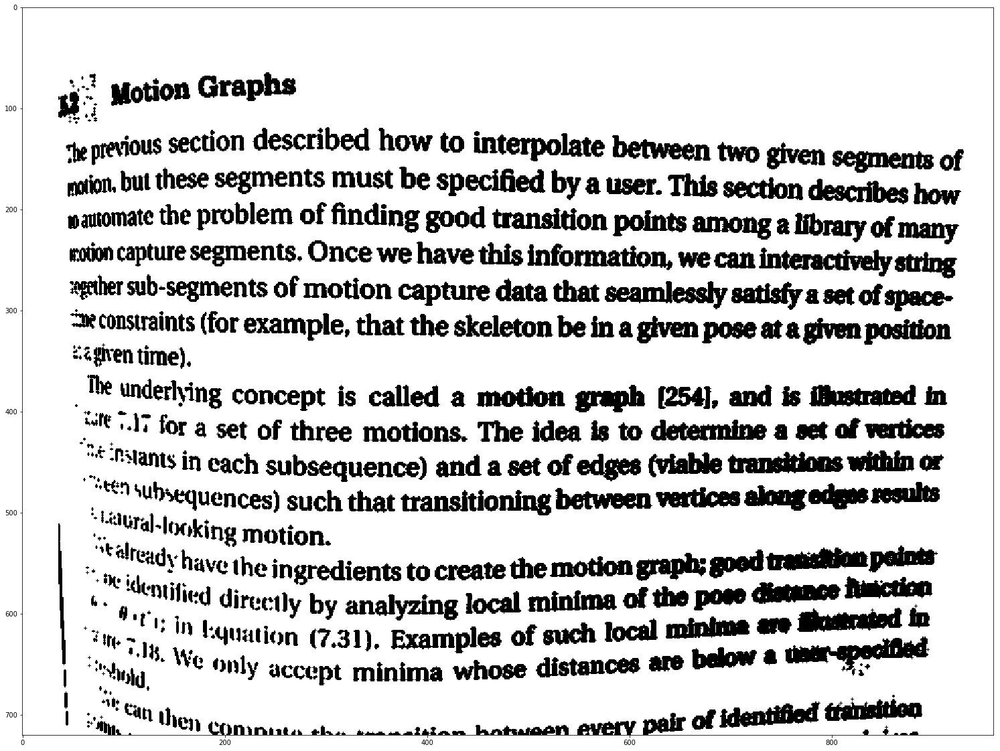

In [327]:
plt.figure(figsize=(30, 20));plt.imshow(R_4, cmap = "gray")

### text5.jpg

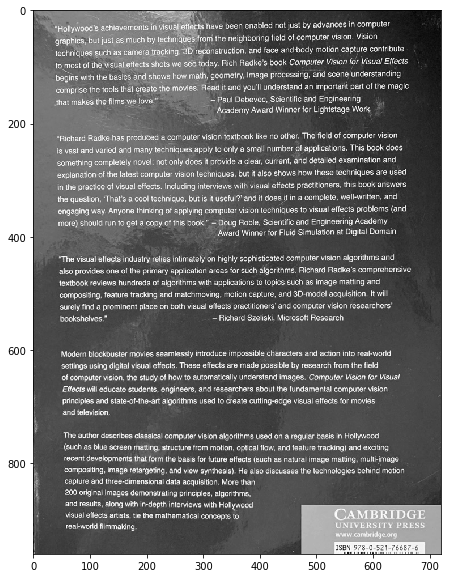

In [361]:
#read image
img = cv2.imread('../../images/segmentaion/text/text5.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 10))
plt.imshow(gray, cmap = "gray")

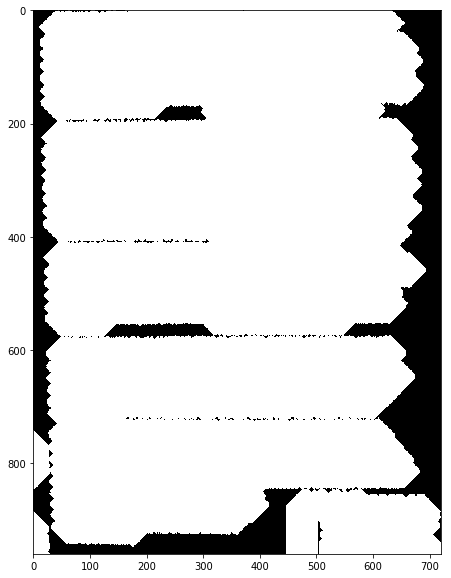

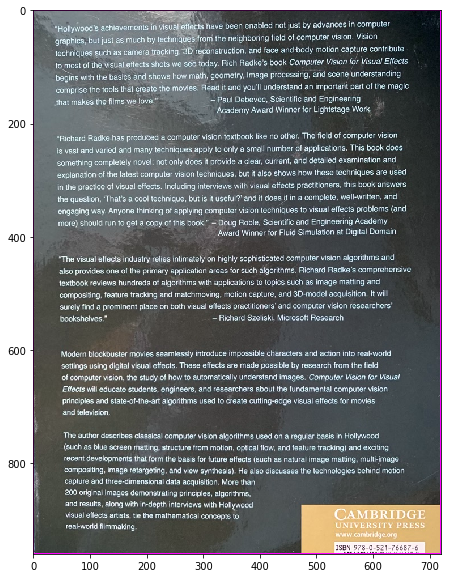

In [367]:
#FIND THE REGION WITH TEXT
#apply threshold
thresh = cv2.threshold(gray,190,255,cv2.THRESH_BINARY)[1]
#generate kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
#dilate
dilated = cv2.dilate(thresh,kernel,iterations = 28)
#find countours
contours, hierarchy= cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

# for each contour found, draw a rectangle around it on original image
dict_text = {} # to store areas of interest
for index,contour in enumerate(contours):
    # get rectangle bounding contour
    [x,y,w,h] = cv2.boundingRect(contour)
    
    if w>600 and h>800: #from human observation:)

        # draw rectangle around contour on original image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,255),2)
        dict_text[index] = [x,y,w+x,h+y]

plt.figure(figsize=(20, 10))
plt.imshow(dilated, cmap = "gray")

plt.figure(figsize=(20, 10))
plt.imshow(img, cmap = "gray")

In [368]:
#detected regions of the text
dict_text

{1: [0, 0, 720, 960]}

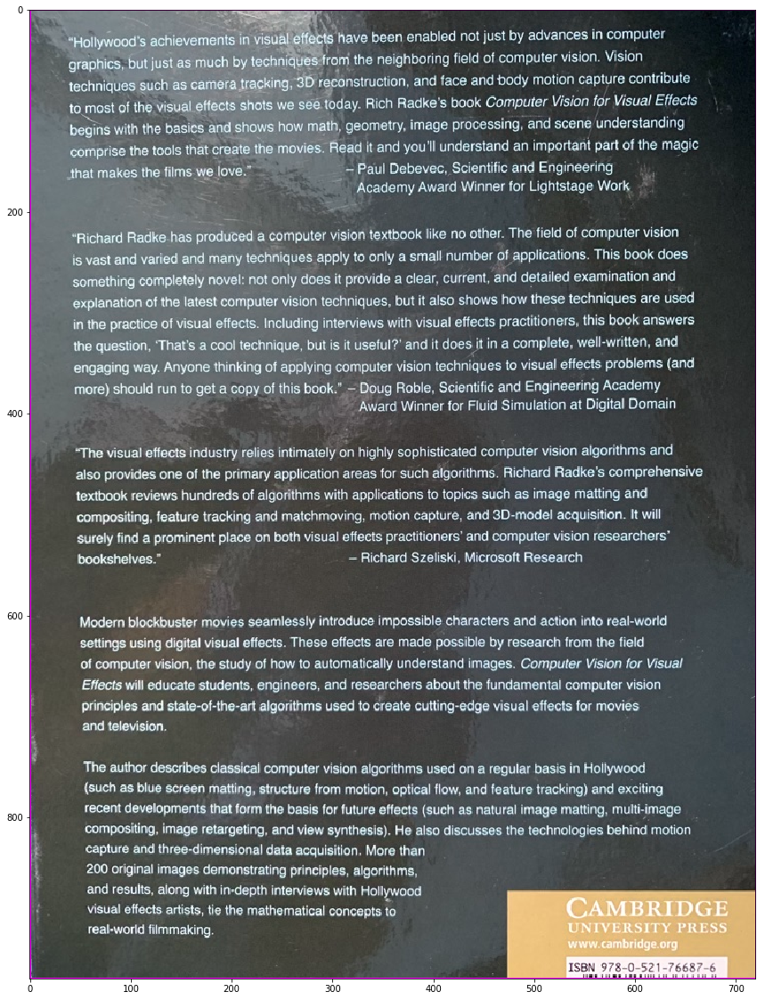

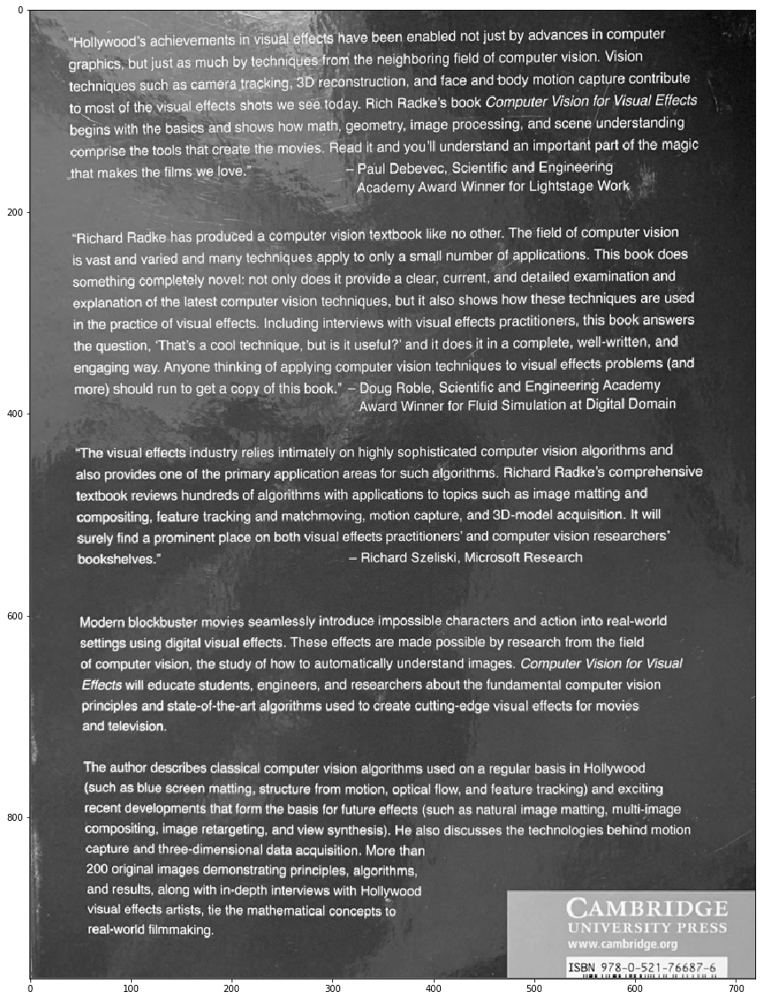

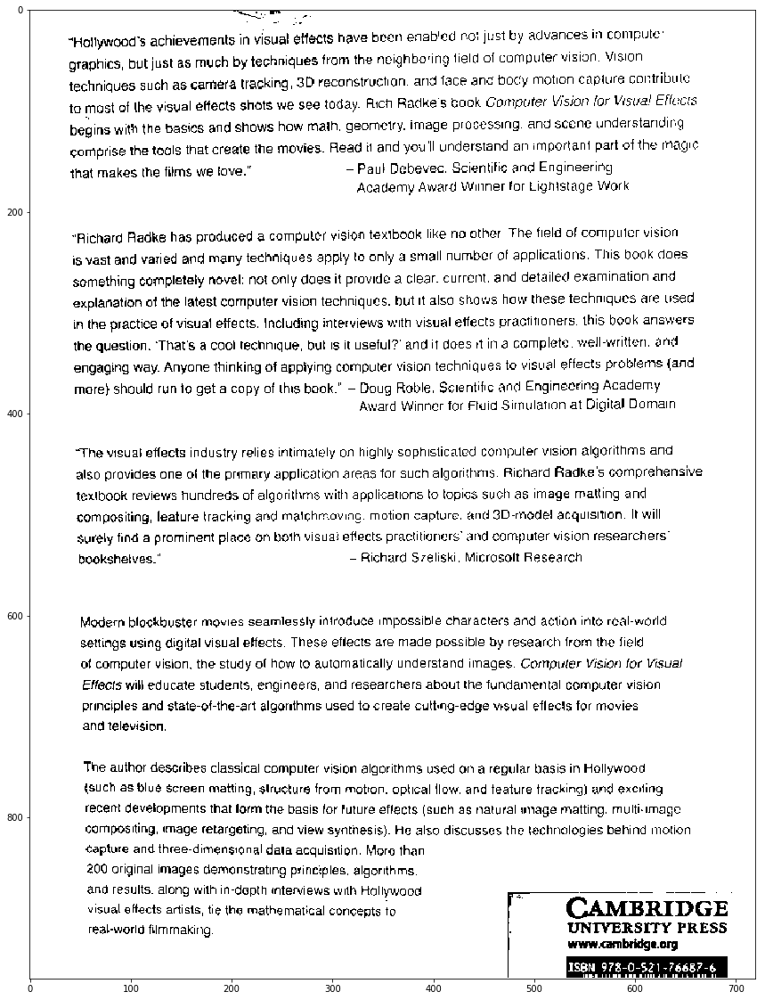

In [387]:
#initialize tensor which corresponds to the dark area of the text
A = img[0:960+1,0:720+1]
plt.figure(1,figsize=(30, 20)); plt.imshow(A, cmap = "gray")

gray_A = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(30, 20));plt.imshow(gray_A, cmap = "gray")

thresh_A = cv2.threshold(gray_A,185,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(30, 20));plt.imshow(thresh_A, cmap = "gray")

### text6.jpg

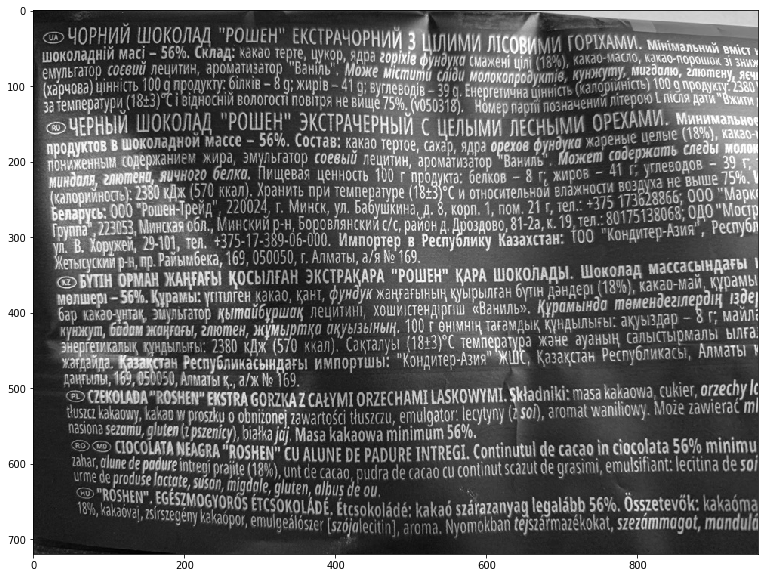

In [433]:
#read image
img = cv2.imread('../../images/segmentaion/text/text6.jpg')
#convert image to gray-scale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 10))
plt.imshow(gray, cmap = "gray")

{0: [8, 0, 960, 702]}

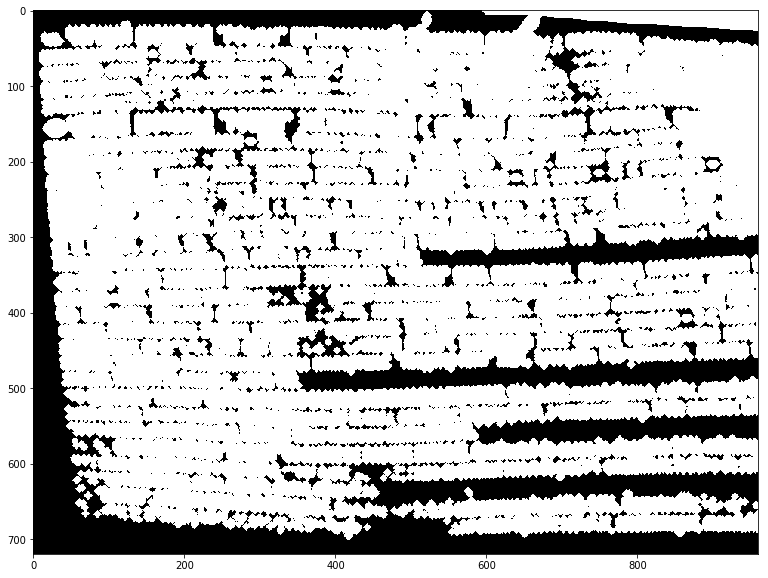

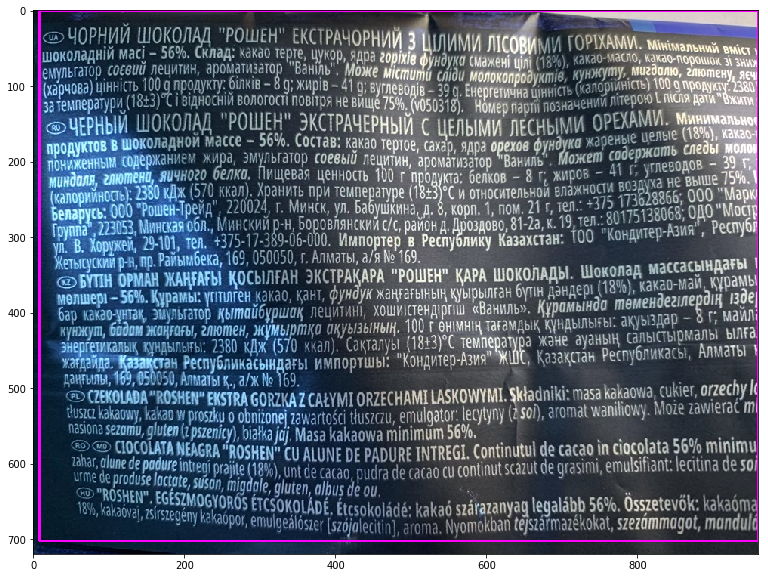

In [432]:
#FIND THE REGION WITH TEXT
#apply threshold
thresh = cv2.threshold(gray,150,255,cv2.THRESH_BINARY)[1]
#generate kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
#dilate
dilated = cv2.dilate(thresh,kernel,iterations = 5)
#find countours
contours, hierarchy= cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

# for each contour found, draw a rectangle around it on original image
dict_text = {} # to store areas of interest
k=0
for index,contour in enumerate(contours):
    # get rectangle bounding contour
    [x,y,w,h] = cv2.boundingRect(contour)
    
    if w>600 and h>500: #from human observation:)

        # draw rectangle around contour on original image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,255),2)
        dict_text[k] = [x,y,w+x,h+y]

plt.figure(figsize=(20, 10))
plt.imshow(dilated, cmap = "gray")

plt.figure(figsize=(20, 10))
plt.imshow(img, cmap = "gray")

#detected regions of the text
dict_text

In [429]:
dict_text[0]

[8, 0, 960, 702]

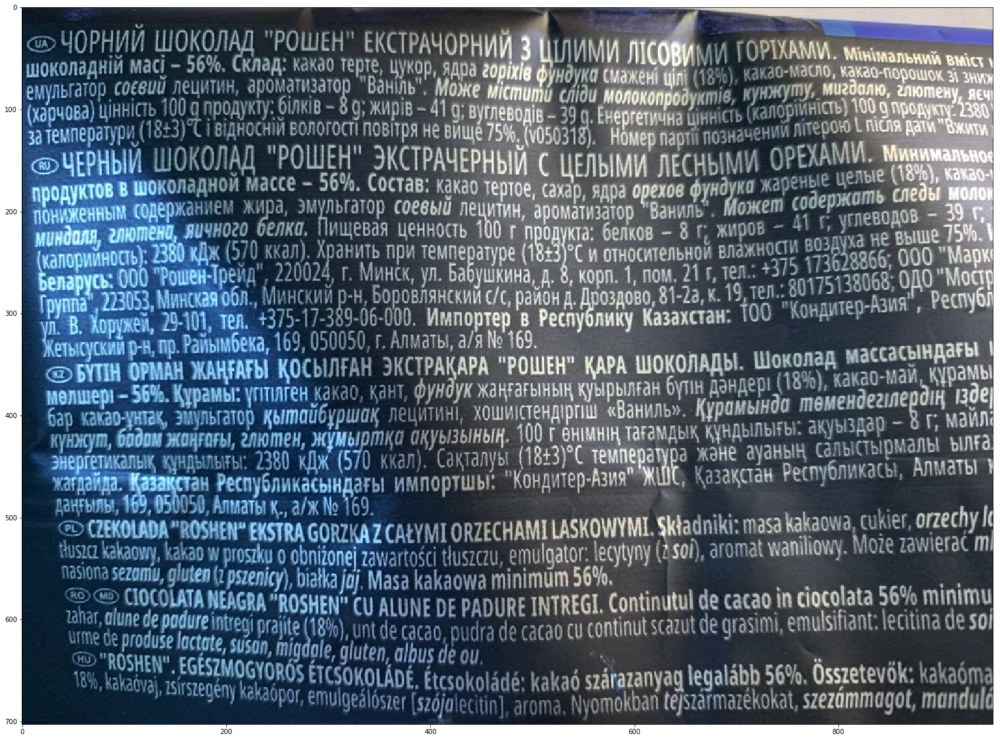

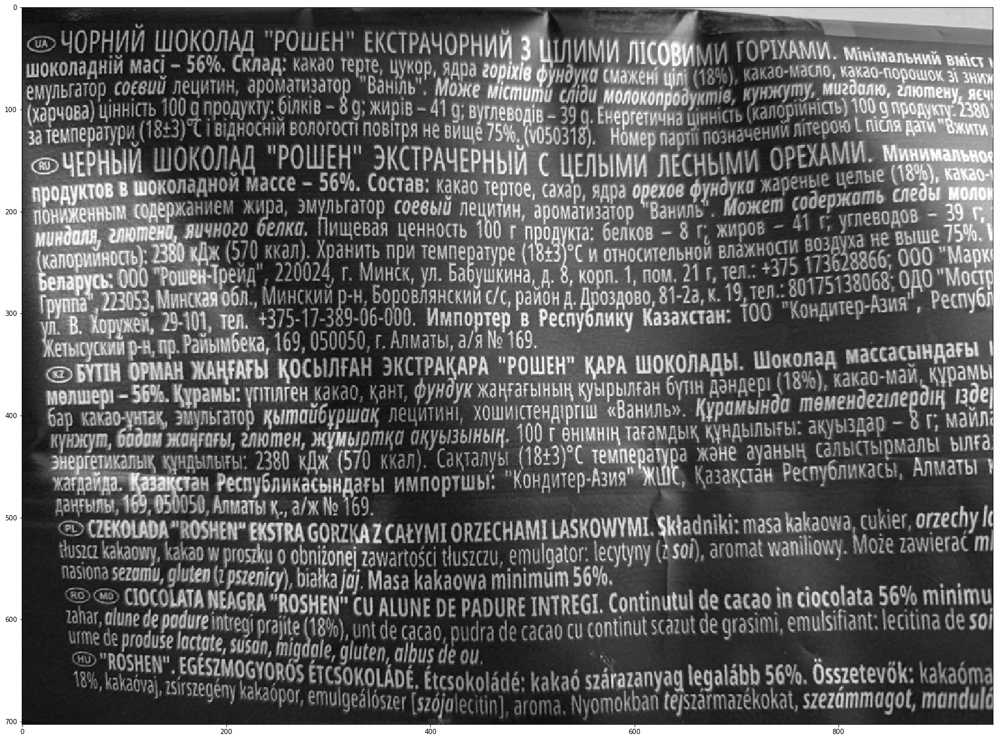

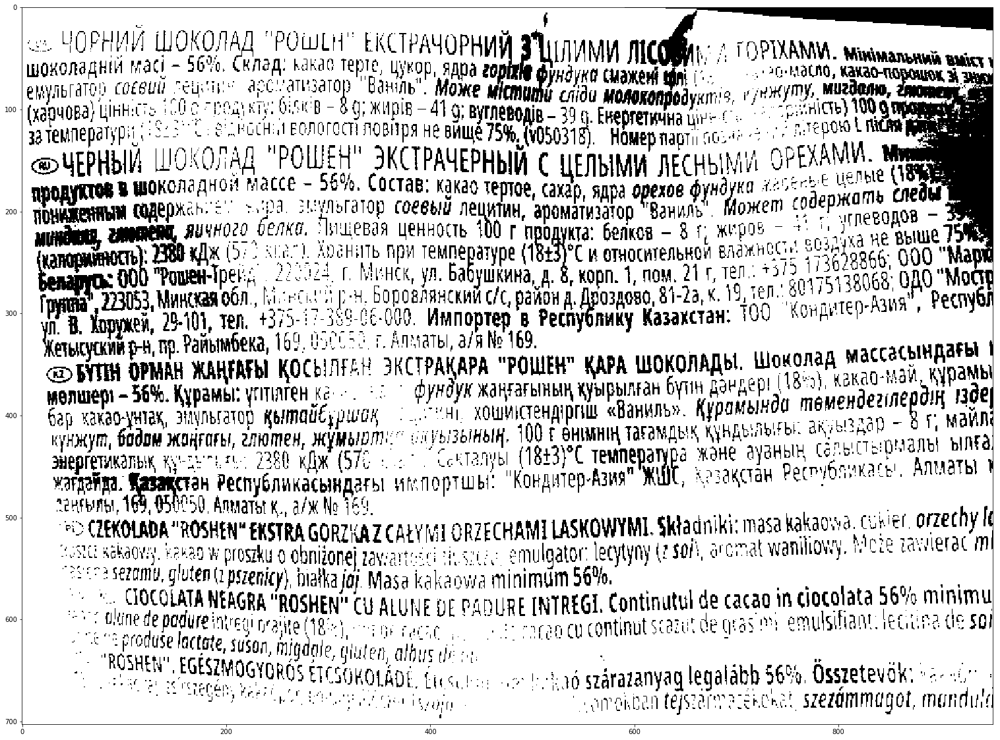

In [440]:
#key in dictionary we are interested in
i=0
#initialize tensor which corresponds to the dark area of the text
A = img[dict_text[i][1]:dict_text[i][3]+1,dict_text[i][0]:dict_text[i][2]+1]
plt.figure(1,figsize=(30, 20)); plt.imshow(A, cmap = "gray")

gray_A = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(30, 20));plt.imshow(gray_A, cmap = "gray")

thresh_A = cv2.threshold(gray_A,150,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(30, 20));plt.imshow(thresh_A, cmap = "gray")

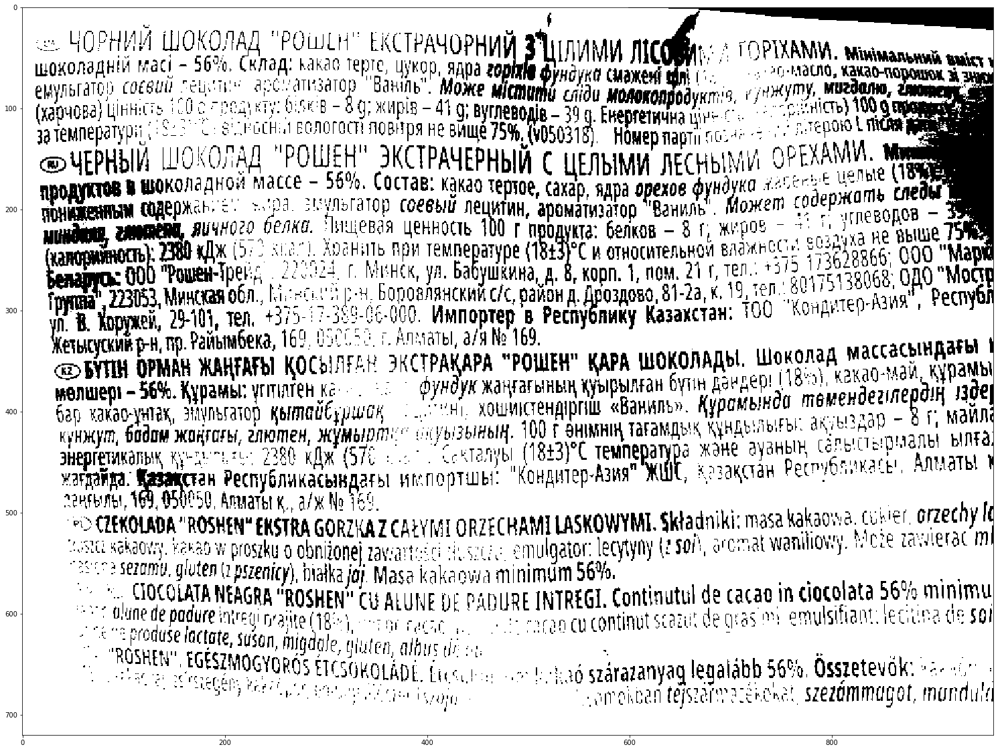

In [442]:
#build a required representation of the text
R_6 = np.ones_like(gray)*255
R_6[dict_text[i][1]:dict_text[i][3]+1,dict_text[i][0]:dict_text[i][2]+1] = thresh_A

plt.figure(figsize=(30, 20));plt.imshow(R_6, cmap = "gray")

#### Some unsuccessful attempts to solve task 2.1.1

[(37, 13), (90, 14), (109, 15), (192, 16), (245, 17), (253, 17), (282, 17), (299, 18), (30, 26), (37, 26), (98, 27), (190, 29), (211, 31), (12, 38), (40, 38), (64, 38), (71, 39), (89, 39), (97, 39), (117, 40), (269, 42), (291, 43), (298, 43), (318, 43), (26, 51), (139, 53), (147, 53)]


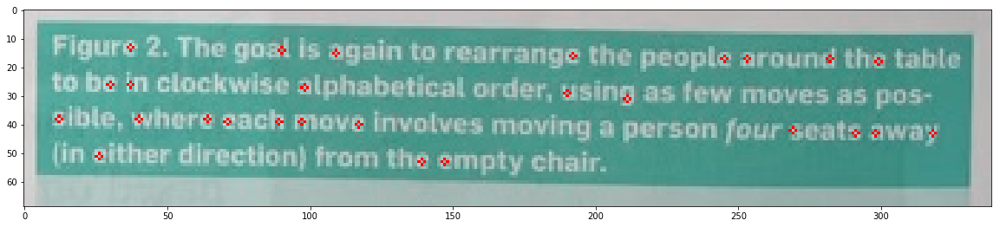

In [227]:
#attemp with applying a brief detector to fimd points of rectangle
def detect_keypoints(img):
    
    # applying Gaussian filter with the size 21x21 and sigma=3
    img_blur = cv2.GaussianBlur(img, (31, 31), 2)

    #detect corners/key points with FAST detector
    fast = cv2.FastFeatureDetector_create()
    cv_kp_arr = fast.detect(img_blur, None)
    
    # keypoints
    kp_arr = []
    for i in range(len(cv_kp_arr)):
        kp_arr.append((
            int(cv_kp_arr[i].pt[0]),
            int(cv_kp_arr[i].pt[1])
        ))
    return kp_arr

kp_arr = detect_keypoints(A)
for corner_coordinates in kp_arr:
        cv2.circle(A,corner_coordinates, radius = 1, color = (255,0,0))
plt.figure(1,figsize=(20, 10)); plt.imshow(A, cmap = "gray")
print(kp_arr)

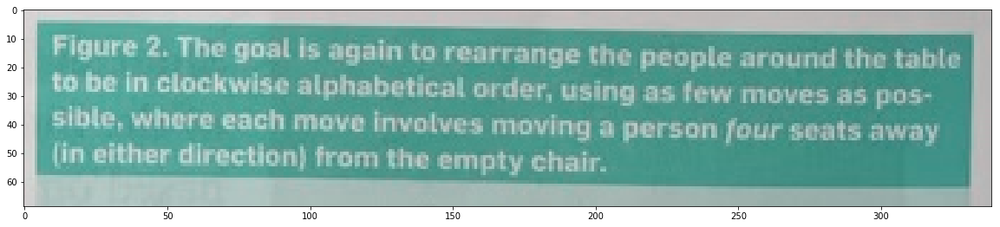

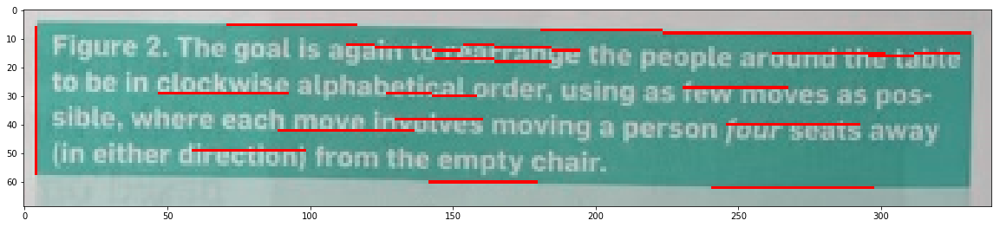

In [222]:
#attempt with canny and hough transformations
img = cv2.imread('../../images/segmentaion/text/text1.jpg')
A = img[575:643+1,359:697+1]
plt.figure(1,figsize=(20, 10)); plt.imshow(A, cmap = "gray")
gray = cv2.cvtColor(A,cv2.COLOR_BGR2GRAY)
plt.figure(2,figsize=(20, 10));plt.imshow(gray, cmap = "gray")

# Find the edges in the image using canny detector
edges = cv2.Canny(image = gray,
                  threshold1 = 90, #max(I)*0.7*0.3
                  threshold2 = 180, #max(I)*0.7
                  L2gradient = True
                )
#Progressive Probabilistic Hough Transform
#Detect points that form a line
lines = cv2.HoughLinesP(image = edges, 
                        rho = 1, 
                        theta = np.pi/180, 
                        threshold = 20, 
                        minLineLength=30, 
                        maxLineGap=2
                       )
# Draw lines on the image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(A, (x1, y1), (x2, y2), (255, 0, 0), 1)

plt.imshow(A, cmap='gray')
plt.show()

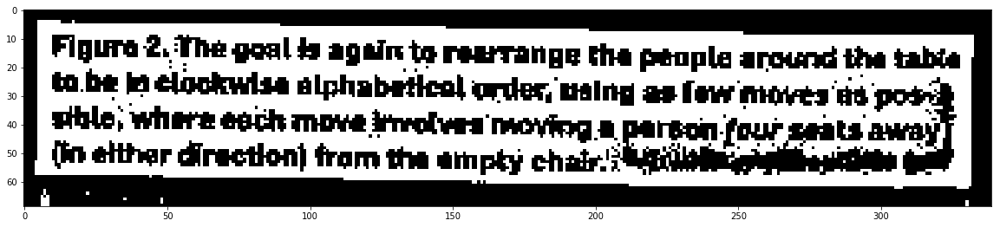

In [235]:
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY_INV, 29, 5)
plt.figure(3,figsize=(20, 10));plt.imshow(thresh, cmap = "gray")


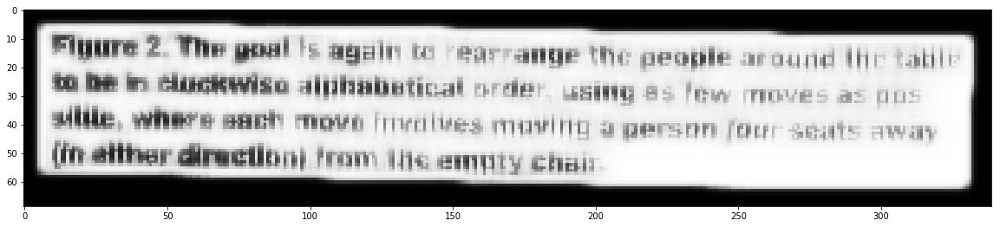

In [242]:
test = cv2.fastNlMeansDenoising(thresh,None,80,7,15)
plt.figure(3,figsize=(20, 10));plt.imshow(test, cmap = "gray")

[(8, 6), (330, 7), (4, 8), (9, 8), (6, 9), (54, 9), (65, 9), (329, 9), (59, 12), (333, 12), (35, 13), (245, 13), (331, 13), (10, 16), (187, 16), (240, 17), (25, 26), (29, 26), (83, 26), (86, 27), (176, 28), (10, 31), (12, 32), (10, 34), (25, 38), (45, 38), (102, 39), (10, 46), (30, 50), (25, 53), (4, 54), (9, 54), (8, 56), (329, 57), (328, 59), (326, 60)]


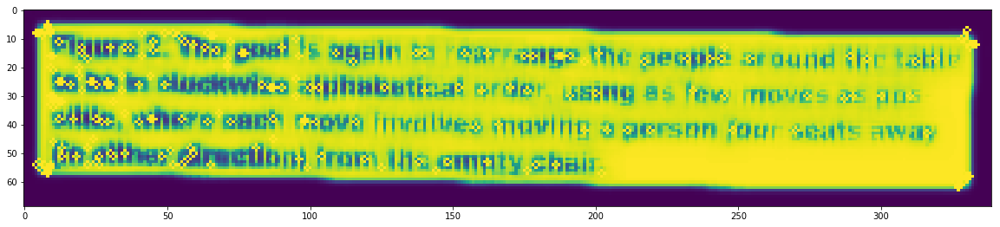

In [245]:
def detect_keypoints(img):
    
    # applying Gaussian filter with the size 21x21 and sigma=3
    img_blur = cv2.GaussianBlur(img, (31, 31), 3)

    #detect corners/key points with FAST detector
    fast = cv2.FastFeatureDetector_create()
    cv_kp_arr = fast.detect(img_blur, None)
    
    # keypoints
    kp_arr = []
    for i in range(len(cv_kp_arr)):
        kp_arr.append((
            int(cv_kp_arr[i].pt[0]),
            int(cv_kp_arr[i].pt[1])
        ))
    return kp_arr

kp_arr = detect_keypoints(test)
for corner_coordinates in kp_arr:
        cv2.circle(test,corner_coordinates, radius = 1, color = (255,0,0))
plt.figure(1,figsize=(20, 10)); plt.imshow(test)
print(kp_arr)

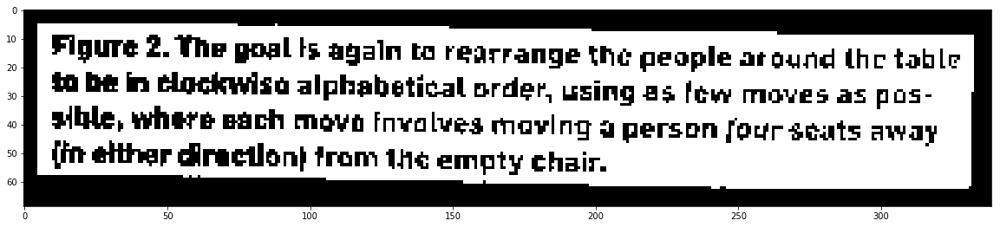

In [241]:

thresh = cv2.threshold(gray,165,255,cv2.THRESH_BINARY_INV)[1]
plt.figure(3,figsize=(20, 10));plt.imshow(thresh, cmap = "gray")

#### References:
1. file:///D:/Studies/UCU_MSc/CV_2019/Module2_Day1.pdf lecture notes
2. https://docs.opencv.org/master/d3/db4/tutorial_py_watershed.html
